In [2]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'opencv-pytorch-classification-project-2:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-competitions-data%2Fkaggle-v2%2F66638%2F7378729%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240616%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240616T010243Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D6328da50f8f8bc072561fb190ad9e2786a96edc130985d03780bfde446ea3bbae677d10e496dfc6ebb41019d30e4ee126c160fa9addd2b7127916c970d9368e6c14152af53d69e1644cfa4aaaf390632ac3ebc8a0cb767329c6afaf6fab2119091a87a0fc0ddcbfdbf12b59693564d6b54cb559307ee7c46faad27d28ca7e143217420e995e42681883031e3d67a8d477cfd86296c5757e0cb9074ab14a6efae161ef838efb416840791a412b1ad85ac2836b8d81b6d502d1c59dde7335938cd07338afabe1bbfb57f83ec7b34fb37ecc61e2935eb44a0f8b63d70c611bd23e7d70a76727e3abf5b1f9b45e74bf438f49a9d399ab4e7eef13dc690d6fea397aa'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 1390481355 bytes downloaded
Downloaded and uncompressed: opencv-pytorch-classification-project-2
Data source import complete.


# <font style="color:blue">Project 2: Kaggle Competition - Classification</font>

#### Maximum Points: 100

<div>
    <table>
        <tr><td><h3>Sr. no.</h3></td> <td><h3>Section</h3></td> <td><h3>Points</h3></td> </tr>
        <tr><td><h3>1</h3></td> <td><h3>Data Loader</h3></td> <td><h3>10</h3></td> </tr>
        <tr><td><h3>2</h3></td> <td><h3>Configuration</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>3</h3></td> <td><h3>Evaluation Metric</h3></td> <td><h3>10</h3></td> </tr>
        <tr><td><h3>4</h3></td> <td><h3>Train and Validation</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>5</h3></td> <td><h3>Model</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>6</h3></td> <td><h3>Utils</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>7</h3></td> <td><h3>Experiment</h3></td><td><h3>5</h3></td> </tr>
        <tr><td><h3>8</h3></td> <td><h3>TensorBoard Dev Scalars Log Link</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>9</h3></td> <td><h3>Kaggle Profile Link</h3></td> <td><h3>50</h3></td> </tr>
    </table>
</div>


## <font style="color:green">1. Data Loader [10 Points]</font>

In this section, you have to write a class or methods, which will be used to get training and validation data loader.

You need to write a custom dataset class to load data.

**Note; There is   no separate validation data. , You will thus have to create your own validation set, by dividing the train data into train and validation data. Usually, we do 80:20 ratio for train and validation, respectively.**


For example:

```python
class KenyanFood13Dataset(Dataset):
    """
    
    """
    
    def __init__(self, *args):
    ....
    ...
    
    def __getitem__(self, idx):
    ...
    ...
    

```


```python
def get_data(args1, *args):
    ....
    ....
    return train_loader, test_loader
```

In [3]:
# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

In [5]:
pip install pytorch_lightning torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 812.2/812.2 kB 18.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 58.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-man

In [6]:
import os
import pandas as pd
import numpy as np
from dataclasses import dataclass
import random

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
from torchvision import transforms,models
# from torchvision.transforms import functional as F
import torch.nn.functional as F

from PIL import Image
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import pytorch_lightning as pl

# for reproducibility
from pytorch_lightning import seed_everything
from pytorch_lightning import Trainer
# Importing EarlyStopping callback
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint, LearningRateMonitor

# Use Module API to track and compute metrics automatically
from torchmetrics import Accuracy, Precision, Recall, F1Score
from torchmetrics import MeanMetric,MaxMetric
from torchmetrics.classification import MulticlassAccuracy,MulticlassF1Score,MulticlassPrecision,MulticlassRecall


In [7]:
import warnings
warnings.filterwarnings("ignore")

In [8]:
import torchvision.models as models

# Get a list of all available models
model_names = sorted(name for name in models.__dict__
    if name.islower() and not name.startswith("__")
    and callable(models.__dict__[name]))

# Print the list of available models
print(model_names)


['alexnet', 'convnext_base', 'convnext_large', 'convnext_small', 'convnext_tiny', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'efficientnet_b0', 'efficientnet_b1', 'efficientnet_b2', 'efficientnet_b3', 'efficientnet_b4', 'efficientnet_b5', 'efficientnet_b6', 'efficientnet_b7', 'efficientnet_v2_l', 'efficientnet_v2_m', 'efficientnet_v2_s', 'get_model', 'get_model_builder', 'get_model_weights', 'get_weight', 'googlenet', 'inception_v3', 'list_models', 'maxvit_t', 'mnasnet0_5', 'mnasnet0_75', 'mnasnet1_0', 'mnasnet1_3', 'mobilenet_v2', 'mobilenet_v3_large', 'mobilenet_v3_small', 'regnet_x_16gf', 'regnet_x_1_6gf', 'regnet_x_32gf', 'regnet_x_3_2gf', 'regnet_x_400mf', 'regnet_x_800mf', 'regnet_x_8gf', 'regnet_y_128gf', 'regnet_y_16gf', 'regnet_y_1_6gf', 'regnet_y_32gf', 'regnet_y_3_2gf', 'regnet_y_400mf', 'regnet_y_800mf', 'regnet_y_8gf', 'resnet101', 'resnet152', 'resnet18', 'resnet34', 'resnet50', 'resnext101_32x8d', 'resnext101_64x4d', 'resnext50_32x4d', 'shufflenet_v2_x0_

In [19]:
data_root = "/kaggle/input/opencv-pytorch-classification-project-2"
path = os.path.join(data_root, "train.csv")
df = pd.read_csv(path)

In [20]:
df.head()

,id,class
0,14278962987112149800,githeri
1,13190220095752321996,ugali
2,10431803432626641638,kachumbari
3,4222441716327528413,githeri
4,2547906925836120627,matoke


In [21]:
df['class'].value_counts()

class
chapati        862
nyamachoma     784
bhaji          632
ugali          628
mandazi        620
kachumbari     494
matoke         483
githeri        479
masalachips    438
sukumawiki     402
pilau          329
mukimo         212
kukuchoma      173
Name: count, dtype: int64

In [22]:
df['class'].nunique()

13

In [23]:
classes = {
         'chapati':0,
         'nyamachoma':1,
         'bhaji':2,
         'mandazi':3,
         'ugali': 4,
         'githeri':5,
         'kachumbari':6,
         'matoke':7,
         'masalachips':8,
         'sukumawiki':9,
         'pilau':10,
         'mukimo':11,
         'kukuchoma':12
         }

#map class names to numerical labels
df['class'] = df['class'].map(classes)

In [24]:
df.head()

,id,class
0,14278962987112149800,5
1,13190220095752321996,4
2,10431803432626641638,6
3,4222441716327528413,5
4,2547906925836120627,7


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6536 entries, 0 to 6535
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      6536 non-null   uint64
 1   class   6536 non-null   int64 
dtypes: int64(1), uint64(1)
memory usage: 102.2 KB


In [26]:
df['id']=df['id'].astype('object')

In [27]:
train_df, valid_df = train_test_split(df, test_size = 0.2, random_state = 42)

In [28]:
train_df.head()

,id,class
548,10862709929141092447,1
5046,12253291056072394591,6
1860,8833937690167916386,0
6074,15932281450747424208,8
1321,8712052877055502942,0


In [29]:
train_df['class'].nunique()

13

In [30]:

class KenyanFood13Dataset(Dataset):
    def __init__(self,data_root, df,transform = None):


        # set transform attribute
        self.transform = transform

        num_classes = 13

        self.df = df

    def __len__(self):
        return len(self.df)

    def __getitem__(self,index):
        "returns images with resize and preprocessing"

        id = str(self.df.iloc[index]['id'])
        image_path = os.path.join(data_root,"images","images",id+".jpg")
        image = Image.open(image_path).convert("RGB")


        if self.transform is not None:
            image = self.transform(image)

        label = self.df.iloc[index]['class']

        return image,label






In [31]:
#use imagenet mean and std for transfer learning. No need to calculate again

mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

In [32]:
class  dataModule(pl.LightningDataModule):
    def __init__(self,data_root,batch_size,num_workers,eff = False):
        super().__init__()

        self.data_root = data_root
        self.batch_size = batch_size
        self.num_workers = num_workers


        if not eff:
            self.preprocess = transforms.Compose(
                    [

                        transforms.Resize((232,232)),
                        transforms.CenterCrop(224),

                        transforms.ToTensor(),
                    ]
                )
        else:
            self.preprocess = transforms.Compose(
                    [

                        transforms.Resize((480,480)),
                        transforms.CenterCrop(480),

                        transforms.ToTensor(),
                    ]
                )

        if not eff:
            self.common_transforms = transforms.Compose(
                [self.preprocess, transforms.Normalize(mean, std)]
            )
        else:
            mean_e = [0.5, 0.5, 0.5]
            std_e = [0.5, 0.5, 0.5]
            self.common_transforms = transforms.Compose(
                [self.preprocess,
                 transforms.Normalize(mean_e, std_e)]
            )

        self.aug_transforms = transforms.Compose([
           # transforms.RandomChoice([

                transforms.ColorJitter(
                    brightness=0.2, contrast=0.2, saturation=0.2, hue=0.3
                ),
                transforms.RandomHorizontalFlip(),
                transforms.RandomVerticalFlip(),
                transforms.RandomRotation(20,fill=(0,)),
             #   transforms.RandomCrop(28, padding=4),
                transforms.RandomGrayscale(p=0.1),
   #         ]),
                self.common_transforms,
              #  transforms.RandomErasing(),
            ]
        )


    def setup(self, stage = None):

        self.train_dataset = KenyanFood13Dataset(self.data_root, train_df,transform = self.aug_transforms)


        self.valid_dataset = KenyanFood13Dataset(self.data_root, valid_df,transform = self.common_transforms)

    def train_dataloader(self):
        train_loader = DataLoader(self.train_dataset,
                                     batch_size=self.batch_size,
                                     shuffle=True,
                                     num_workers=self.num_workers,
                                     drop_last=True
        )
        return train_loader

    def val_dataloader(self):
        valid_loader = DataLoader(self.valid_dataset,
                                     batch_size=self.batch_size,
                                     shuffle=False,
                                     num_workers=self.num_workers,
        )
        return valid_loader



In [33]:

data_module = dataModule(data_root, batch_size=24, num_workers=2)
data_module_setup = data_module.setup()
train_loader = data_module.train_dataloader()




24


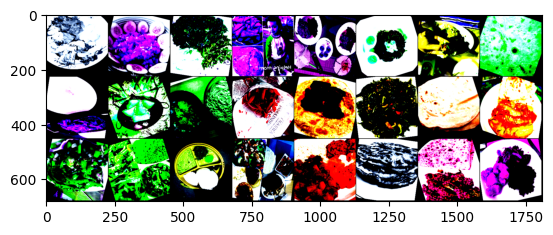

In [34]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(train_loader))
print(len(inputs))
# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, )

## <font style="color:green">2. Configuration [5 Points]</font>

**Define your configuration here.**

For example:


```python
@dataclass
class TrainingConfiguration:
    '''
    Describes configuration of the training process
    '''
    batch_size: int = 10
    epochs_count: int = 50  
    init_learning_rate: float = 0.1  # initial learning rate for lr scheduler
    log_interval: int = 5  
    test_interval: int = 1  
    data_root: str = "/kaggle/input/opencv-pytorch-classification-project-2/"
    num_workers: int = 2  
    device: str = 'cuda'  
    
```

In [35]:
def system_config(SEED_VALUE = 42):

    random.seed(SEED_VALUE)
    np.random.seed(SEED_VALUE)
    torch.manual_seed(SEED_VALUE)

    if torch.cuda.is_available():
        device = torch.device('cuda')

        GPU_AVAILABLE = True

        torch.cuda.manual_seed(SEED_VALUE)
        torch.cuda.manual_seed_all(SEED_VALUE)

         # Performance and deterministic behavior.
        torch.backends.cudnn.enabled = True       # Provides highly optimized primitives for DL operations.
        torch.backends.cudnn.deterministic = True # Insures deterministic even when above cudnn is enabled.
        torch.backends.cudnn.benchmark = False    # Setting to True can cause non-deterministic behavior.
    else:
        device = torch.device('cpu')

        GPU_AVAILABLE = False
        torch.use_deterministic_algorithms(True)


    return str(device), GPU_AVAILABLE

In [36]:
device , GPU_available = system_config()
print(device)
print(GPU_available)

cuda
True


In [37]:
@dataclass
class StandardConfig:
    BATCH_SIZE:           int = 16
   # IMG_SHAPE:          tuple = (256,256)
    NUM_CLASSES:          int = 13
    EPOCHS:               int = 70
    DATA_ROOT:            str = "/kaggle/input/opencv-pytorch-classification-project-2"
    NUM_WORKERS:          int = 4
    LEARNING_RATE: float = 5e-4


In [38]:
#weights = models.ConvNeXt_Large_Weights.DEFAULT
weights = models.ConvNeXt_Large_Weights.DEFAULT

transforms = weights.transforms()
transforms

ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

## <font style="color:green">3. Evaluation Metric [10 Points]</font>

**Define methods or classes that will be used in model evaluation. For example, accuracy, f1-score etc.**

Already done in TransferLearningwithResnet


Use MulticlassPrecision when each instance belongs to exactly one class out of multiple classes.
Use MultilabelPrecision when each instance can belong to multiple classes simultaneously.

## <font style="color:green">4. Train and Validation [5 Points]</font>


**Write the methods or classes to be used for training and validation.**

In [39]:
#Focal Loss implementation
from torch import Tensor
from typing import List
class FocalLoss(nn.Module):
  #useful for classification tasks when there is a large class imbalance.

  def __init__(self,
                 alpha: List[Tensor] = None,
                 gamma: float = 0.,
                 reduction: str = 'mean',
                 ignore_index: int = -100):

      super().__init__()

      if reduction not in ['mean', 'sum', 'none']:
        raise ValueError(
                  'Reduction must be one of: "mean", "sum", "none".')
      self.alpha = alpha
      self.alpha = self.alpha.to(device)
      self.gamma = gamma
      self.reduction = reduction

  def forward(self,pred,target):
      ce_loss = F.cross_entropy(pred, target, reduction = 'none')
      pt = torch.exp(-ce_loss)
      loss = self.alpha[target] * (1-pt) ** self.gamma * ce_loss  #ce = -log(pt)
      if self.reduction == 'mean':
              loss = loss.mean()
      elif self.reduction == 'sum':
              loss = loss.sum()
      return loss




In [49]:
import numpy as np
def class_weight(train_labels):
    class_counts = np.bincount(train_labels)
    num_classes = len(class_counts)
    total_samples = len(train_labels)

    class_weights = []
    for count in class_counts:
        weight = 1 / (count / total_samples)
        class_weights.append(weight)
    return class_weights
alpha = class_weight(train_df["class"])
#alpha is inverse of class frequency

In [40]:
class FineTuningwithConvNext(pl.LightningModule):
    def __init__(self,learning_rate,
                model_name = "FoodClassification_ConvNext",
                 pretrained = True,
              #   finetune_start = 1,
                 num_classes = 13,
                 criterion = None
                ):
        super().__init__()
        self.save_hyperparameters()

        self.model = get_convnext_large(self.hparams.num_classes)
     #   model2 = get_swin_t(self.hparams.num_classes)
     #   self.model = EnsembleModel(model1,model2,self.hparams.num_classes)

        #initialize evaluation metrics
        self.mean_train_loss = MeanMetric()
        self.train_acc  = MulticlassAccuracy(num_classes = self.hparams.num_classes, average = 'weighted')

        self.mean_valid_loss = MeanMetric()
        self.valid_accuracy  = MulticlassAccuracy(num_classes = self.hparams.num_classes, average = 'weighted')

        self.valid_precision = MulticlassPrecision(num_classes = self.hparams.num_classes, average = 'weighted')
        self.valid_recall = MulticlassRecall(num_classes = self.hparams.num_classes, average = 'weighted')
        self.valid_f1_score = MulticlassF1Score(num_classes=self.hparams.num_classes,average='weighted')

        # for tracking best so far validation accuracy
        self.val_acc_best = MaxMetric()

    def forward(self,x):
        return self.model(x)

    def _shared_step(self,data,target):
        #get prediction
        output = self(data)

        #calculate loss
       # loss = F.cross_entropy(output,target)
        loss = self.hparams.criterion(output,target)

        #get probability score using softmax
        prob = F.softmax(output,dim = 1)

        #get index of maximum probability
        pred_batch = output.detach().argmax(dim=1)

        return loss, pred_batch


    def training_step(self,batch,batch_idx, *args, **kwargs):

        #get data and labels from batch
        data,target = batch

        loss, pred = self._shared_step(data,target)
        #print(pred)

        #calculate and accumulate running batch evaluation metrics
        # The weight parameter is used in case the batch dimension differs.
        weight = data.shape[0]
        self.mean_train_loss(loss,weight = weight)
        self.train_acc(pred,target)


        #log metrics to a logger(default: tensorboard)
        self.log("train/loss" , self.mean_train_loss, on_step = True,on_epoch = True,prog_bar = True)
        self.log("train/accuracy", self.train_acc, on_step = True, on_epoch = True,prog_bar = True)

        return loss

    def on_train_epoch_end(self):
         # Computing and logging the training mean loss & mean accuracy.

        self.log("step", self.current_epoch) # Set X-axis as epoch number for epoch-level metrics

    def validation_step(self,batch,batch_idx, *args, **kwargs):

        #get data and labels from batch
        data,target = batch
        loss, pred = self._shared_step(data,target)

        #calculate and accumulate running batch evaluation metrics
        # The weight parameter is used in case the batch dimension differs.
        weight = data.shape[0]
        self.mean_valid_loss(loss,weight = weight)

        self.valid_accuracy(pred,target)
        self.valid_precision(pred,target)
        self.valid_recall(pred,target)
        self.valid_f1_score(pred,target)


        #log metrics to a logger(default: tensorboard)
        self.log("valid/loss" , self.mean_valid_loss, on_step = True,on_epoch = True, prog_bar = True)
        self.log("valid/acc", self.valid_accuracy, on_step = True, on_epoch = True, prog_bar = True)
        self.log("valid/precision", self.valid_precision,on_step = False, on_epoch = True, prog_bar = False)
        self.log("valid/recall", self.valid_recall, on_step = False,on_epoch = True, prog_bar = False)
        self.log("valid/train_f1_score", self.valid_f1_score,on_step = False, on_epoch = True, prog_bar = False)

    def on_validation_epoch_end(self):


        acc = self.valid_accuracy.compute()  # get current val acc
        self.val_acc_best(acc)  # update best so far val acc
        # log `val_acc_best` as a value through `.compute()` method, instead of as a metric object
        # otherwise metric would be reset by lightning after each epoch
        self.log("val/acc_best", self.val_acc_best.compute(), on_step=False, on_epoch=True, prog_bar=True)
        self.log("step", self.current_epoch) # Set X-axis as epoch number for epoch-level metrics



    def predict_step(self,batch):
        data = batch
        if isinstance(data, list):
            data = data[0]  # Ensure the data is a tensor
        output =  self(data)
        prob = F.softmax(output,dim = 1)
        pred = torch.argmax(prob,dim = 1)
        return pred
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.hparams.learning_rate)



In [ ]:
# class FineTuningwithSwinT(pl.LightningModule):
#     def __init__(self,learning_rate,
#                 model_name = "FoodClassification_SwinT",
#                  pretrained = True,
#               #   finetune_start = 1,
#                  num_classes = 13,
#                  criterion = None
#                 ):
#         super().__init__()
#         self.save_hyperparameters()

#         self.model = get_swin_t(self.hparams.num_classes)

#         #initialize evaluation metrics
#         self.mean_train_loss = MeanMetric()
#         self.train_acc  = MulticlassAccuracy(num_classes = self.hparams.num_classes, average = 'weighted')

#         self.mean_valid_loss = MeanMetric()
#         self.valid_accuracy  = MulticlassAccuracy(num_classes = self.hparams.num_classes, average = 'weighted')

#         self.valid_precision = MulticlassPrecision(num_classes = self.hparams.num_classes, average = 'weighted')
#         self.valid_recall = MulticlassRecall(num_classes = self.hparams.num_classes, average = 'weighted')
#         self.valid_f1_score = MulticlassF1Score(num_classes=self.hparams.num_classes,average='weighted')

#         # for tracking best so far validation accuracy
#         self.val_acc_best = MaxMetric()

#     def forward(self,x):
#         return self.model(x)

#     def _shared_step(self,data,target):
#         #get prediction
#         output = self(data)

#         #calculate loss
#        # loss = F.cross_entropy(output,target)
#         loss = self.hparams.criterion(output,target)

#         #get probability score using softmax
#         prob = F.softmax(output,dim = 1)

#         #get index of maximum probability
#         pred_batch = output.detach().argmax(dim=1)

#         return loss, pred_batch


#     def training_step(self,batch,batch_idx, *args, **kwargs):

#         #get data and labels from batch
#         data,target = batch

#         loss, pred = self._shared_step(data,target)
#         #print(pred)

#         #calculate and accumulate running batch evaluation metrics
#         # The weight parameter is used in case the batch dimension differs.
#         weight = data.shape[0]
#         self.mean_train_loss(loss,weight = weight)
#         self.train_acc(pred,target)


#         #log metrics to a logger(default: tensorboard)
#         self.log("train/loss" , self.mean_train_loss, on_step = True,on_epoch = True,prog_bar = True)
#         self.log("train/accuracy", self.train_acc, on_step = True, on_epoch = True,prog_bar = True)

#         return loss

#     def on_train_epoch_end(self):
#          # Computing and logging the training mean loss & mean accuracy.

#         self.log("step", self.current_epoch) # Set X-axis as epoch number for epoch-level metrics

#     def validation_step(self,batch,batch_idx, *args, **kwargs):

#         #get data and labels from batch
#         data,target = batch
#         loss, pred = self._shared_step(data,target)

#         #calculate and accumulate running batch evaluation metrics
#         # The weight parameter is used in case the batch dimension differs.
#         weight = data.shape[0]
#         self.mean_valid_loss(loss,weight = weight)

#         self.valid_accuracy(pred,target)
#         self.valid_precision(pred,target)
#         self.valid_recall(pred,target)
#         self.valid_f1_score(pred,target)


#         #log metrics to a logger(default: tensorboard)
#         self.log("valid/loss" , self.mean_valid_loss, on_step = True,on_epoch = True, prog_bar = True)
#         self.log("valid/acc", self.valid_accuracy, on_step = True, on_epoch = True, prog_bar = True)
#         self.log("valid/precision", self.valid_precision,on_step = False, on_epoch = True, prog_bar = False)
#         self.log("valid/recall", self.valid_recall, on_step = False,on_epoch = True, prog_bar = False)
#         self.log("valid/train_f1_score", self.valid_f1_score,on_step = False, on_epoch = True, prog_bar = False)

#     def on_validation_epoch_end(self):


#         acc = self.valid_accuracy.compute()  # get current val acc
#         self.val_acc_best(acc)  # update best so far val acc
#         # log `val_acc_best` as a value through `.compute()` method, instead of as a metric object
#         # otherwise metric would be reset by lightning after each epoch
#         self.log("val/acc_best", self.val_acc_best.compute(), on_step=False, on_epoch=True, prog_bar=True)
#         self.log("step", self.current_epoch) # Set X-axis as epoch number for epoch-level metrics



#     def predict_step(self,batch):
#         data = batch
#         if isinstance(data, list):
#             data = data[0]  # Ensure the data is a tensor
#         output =  self(data)
#         prob = F.softmax(output,dim = 1)
#         pred = torch.argmax(prob,dim = 1)
#         return pred
#     def configure_optimizers(self):
#         return torch.optim.Adam(self.parameters(), lr=self.hparams.learning_rate)



In [41]:
class FineTuningwithEffNet(pl.LightningModule):
    def __init__(self,learning_rate,
                model_name = "FoodClassification_EffNeT",
                 pretrained = True,
              #   finetune_start = 1,
                 num_classes = 13,
                 criterion = None
                ):
        super().__init__()
        self.save_hyperparameters()

        self.model = get_efficientnet(self.hparams.num_classes)

        #initialize evaluation metrics
        self.mean_train_loss = MeanMetric()
        self.train_acc  = MulticlassAccuracy(num_classes = self.hparams.num_classes, average = 'weighted')

        self.mean_valid_loss = MeanMetric()
        self.valid_accuracy  = MulticlassAccuracy(num_classes = self.hparams.num_classes, average = 'weighted')

        self.valid_precision = MulticlassPrecision(num_classes = self.hparams.num_classes, average = 'weighted')
        self.valid_recall = MulticlassRecall(num_classes = self.hparams.num_classes, average = 'weighted')
        self.valid_f1_score = MulticlassF1Score(num_classes=self.hparams.num_classes,average='weighted')

        # for tracking best so far validation accuracy
        self.val_acc_best = MaxMetric()

    def forward(self,x):
        return self.model(x)

    def _shared_step(self,data,target):
        #get prediction
        output = self(data)

        #calculate loss
       # loss = F.cross_entropy(output,target)
        loss = self.hparams.criterion(output,target)

        #get probability score using softmax
        prob = F.softmax(output,dim = 1)

        #get index of maximum probability
        pred_batch = output.detach().argmax(dim=1)

        return loss, pred_batch


    def training_step(self,batch,batch_idx, *args, **kwargs):

        #get data and labels from batch
        data,target = batch

        loss, pred = self._shared_step(data,target)
        #print(pred)

        #calculate and accumulate running batch evaluation metrics
        # The weight parameter is used in case the batch dimension differs.
        weight = data.shape[0]
        self.mean_train_loss(loss,weight = weight)
        self.train_acc(pred,target)


        #log metrics to a logger(default: tensorboard)
        self.log("train/loss" , self.mean_train_loss, on_step = True,on_epoch = True,prog_bar = True)
        self.log("train/accuracy", self.train_acc, on_step = True, on_epoch = True,prog_bar = True)

        return loss

    def on_train_epoch_end(self):
         # Computing and logging the training mean loss & mean accuracy.

        self.log("step", self.current_epoch) # Set X-axis as epoch number for epoch-level metrics

    def validation_step(self,batch,batch_idx, *args, **kwargs):

        #get data and labels from batch
        data,target = batch
        loss, pred = self._shared_step(data,target)

        #calculate and accumulate running batch evaluation metrics
        # The weight parameter is used in case the batch dimension differs.
        weight = data.shape[0]
        self.mean_valid_loss(loss,weight = weight)

        self.valid_accuracy(pred,target)
        self.valid_precision(pred,target)
        self.valid_recall(pred,target)
        self.valid_f1_score(pred,target)


        #log metrics to a logger(default: tensorboard)
        self.log("valid/loss" , self.mean_valid_loss, on_step = True,on_epoch = True, prog_bar = True)
        self.log("valid/acc", self.valid_accuracy, on_step = True, on_epoch = True, prog_bar = True)
        self.log("valid/precision", self.valid_precision,on_step = False, on_epoch = True, prog_bar = False)
        self.log("valid/recall", self.valid_recall, on_step = False,on_epoch = True, prog_bar = False)
        self.log("valid/train_f1_score", self.valid_f1_score,on_step = False, on_epoch = True, prog_bar = False)

    def on_validation_epoch_end(self):


        acc = self.valid_accuracy.compute()  # get current val acc
        self.val_acc_best(acc)  # update best so far val acc
        # log `val_acc_best` as a value through `.compute()` method, instead of as a metric object
        # otherwise metric would be reset by lightning after each epoch
        self.log("val/acc_best", self.val_acc_best.compute(), on_step=False, on_epoch=True, prog_bar=True)
        self.log("step", self.current_epoch) # Set X-axis as epoch number for epoch-level metrics



    def predict_step(self,batch):
        data = batch
        if isinstance(data, list):
            data = data[0]  # Ensure the data is a tensor
        output =  self(data)
        prob = F.softmax(output,dim = 1)
        pred = torch.argmax(prob,dim = 1)
        return pred
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.hparams.learning_rate)



## <font style="color:green">5. Model [5 Points]</font>

**Define your model in this section.**

**You are allowed to use any pre-trained model.**

In [42]:
def get_convnext_large(num_classes):
  model = models.convnext_large(weights = models.ConvNeXt_Large_Weights.IMAGENET1K_V1)
  for param in model.parameters():
            param.requires_grad = False
  for param in model.features[7][1].parameters():
            param.requires_grad = True

  for param in model.features[7][2].parameters():
            param.requires_grad = True

  num_features = model.classifier[-1].in_features
  model.classifier = nn.Sequential(
      nn.Flatten(start_dim=1)  ,
      nn.LayerNorm(num_features),
      nn.ReLU(),
      nn.BatchNorm1d(num_features),
      nn.Linear(num_features, num_classes)

  )

  return model



In [ ]:
# def get_swin_t(num_classes):
#   model = models.swin_v2_t(weights = models.Swin_V2_T_Weights.DEFAULT)
#   for param in model.parameters():
#             param.requires_grad = False
#   for param in model.features[7][0].parameters():
#             param.requires_grad = True
#   for param in model.features[7][1].parameters():
#             param.requires_grad = True

#   num_features = model.head.in_features
#   model.head = nn.Linear(num_features, num_classes)
#   return model

In [43]:
def get_efficientnet(num_classes):
  model = models.efficientnet_v2_l(weights = models.EfficientNet_V2_L_Weights.IMAGENET1K_V1)
  for param in model.parameters():
    param.requires_grad = False
#  length = len(model.features[7])-1
  for param in model.features[7]:
    param.requires_grad = True
  for param in model.features[8]:
    param.requires_grad = True

  num_features = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(in_features = num_features, out_features = num_classes,bias = True)
  return model

## <font style="color:green">6. Utils [5 Points]</font>

**Define those methods or classes, which have  not been covered in the above sections.**

In [44]:
classes = {
         'chapati':0,
         'nyamachoma':1,
         'bhaji':2,
         'mandazi':3,
         'ugali': 4,
         'githeri':5,
         'kachumbari':6,
         'matoke':7,
         'masalachips':8,
         'sukumawiki':9,
         'pilau':10,
         'mukimo':11,
         'kukuchoma':12
         }

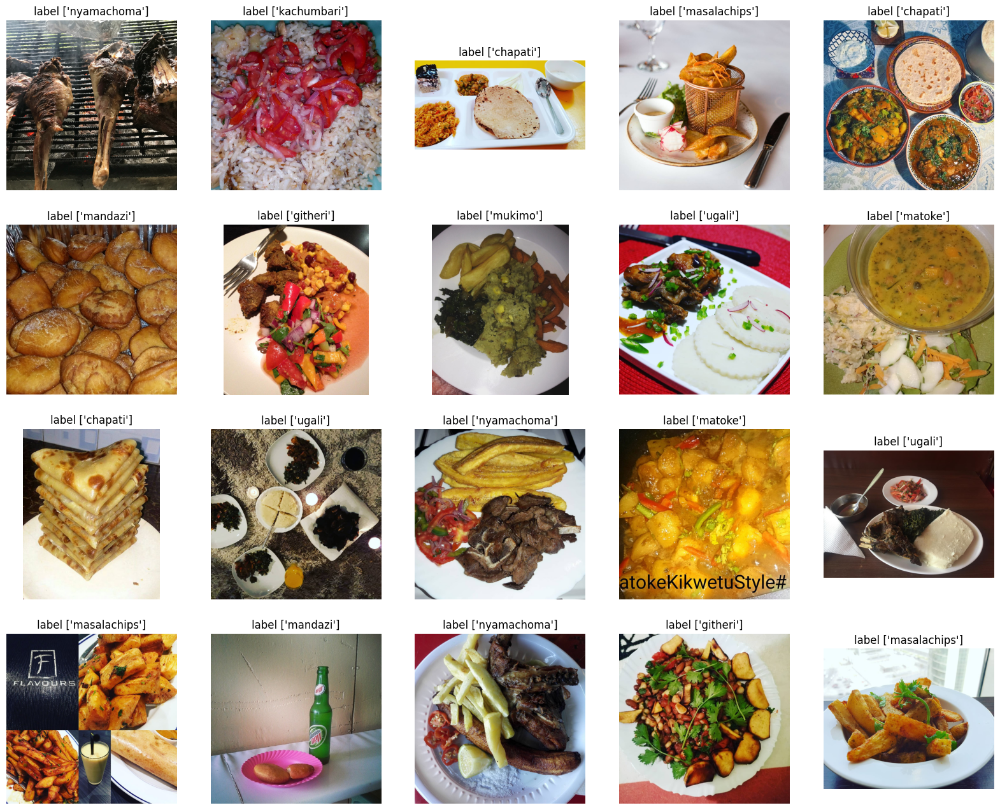

In [45]:
def visualization(df , index):
    id = str(df.iloc[index]['id'])
    label = df.iloc[index]['class']
    label = [id for id, name in classes.items() if name == label]
    image_path = os.path.join(data_root,"images","images",id+".jpg")
    image = Image.open(image_path)#.convert("RGB")
    return image,label


fig, axs = plt.subplots(4, 5, figsize=(20, 16))
for idx, ax in zip(np.arange(20), axs.flatten()):
    image,label = visualization(train_df, idx)
    ax.imshow(image)
    ax.set_title(f'label {label}')
    ax.axis('off')


plt.show()

In [46]:
%reload_ext tensorboard
%tensorboard --logdir=lightning_logs/

<IPython.core.display.Javascript object>

## <font style="color:green">7. Experiment [5 Points]</font>

**Choose your optimizer and LR-scheduler and use the above methods and classes to train your model.**

In [47]:
def training_validation_ConvNext(*,
                       batch_size,
                       epochs,
                        init_lr,
                      ##  max_lr,
                        data_root,
                        num_classes,
                        num_workers,
                        alpha):

    pl.seed_everything(42, workers = True)
    alpha = alpha
    if not isinstance(alpha, Tensor):
                alpha = torch.tensor(alpha)
    criterion = FocalLoss(alpha = alpha,gamma = 2, reduction = 'mean')

    model = FineTuningwithConvNext(learning_rate = init_lr,num_classes = num_classes,criterion = criterion)

    data_module = dataModule(data_root = data_root, batch_size = batch_size, num_workers = num_workers)



    # Creating ModelCheckpoint callback.
    # Checkpoints by default will be saved in Trainer - default_root_dir which is "lightning_logs".
    model_checkpoint = ModelCheckpoint(monitor = 'valid/acc',
                                      mode = 'max',
                                      filename = 'FT_Food_classify_Data_checkpoints_ConvNext{epoch:03d}',
                                      auto_insert_metric_name = False,
                                      save_weights_only=True,)

    # Creating a learning rate monitor callback which will be plotted/added in the default logger.
    lr_monitor = LearningRateMonitor(logging_interval = "step")

   # early_stopping_callback = EarlyStopping(monitor="valid/loss")

    # Initializing the Trainer class object.
    # It uses 'Tensorboard' as its default logger.
    try:
        trainer = pl.Trainer(accelerator = "auto",
                             devices = "auto",
                             strategy="auto",
                             max_epochs = epochs,
                             precision = "16-mixed",
                             deterministic = True, #for deterministic and reproducible training
                             callbacks=[                 # Declaring callbacks to use.
                                    #    EarlyStopping(monitor="valid/loss",patience= 8 ),
                                        model_checkpoint,
                                        lr_monitor,
                                      #  early_stopping_callback
                                        ],
                             log_every_n_steps=1,
                            )
        trainer.fit(model,data_module)
    except KeyboardInterrupt:
        print("Training interrupted.")



    return model, data_module, model_checkpoint.best_model_path

In [50]:

from torchvision import transforms

model1, data_module1, best_ckpt_path1, = training_validation_ConvNext(
                                            batch_size  = StandardConfig.BATCH_SIZE,
                                            epochs      = StandardConfig.EPOCHS,
                                            init_lr     = StandardConfig.LEARNING_RATE,
                                          #  max_lr      = StandardConfig.MAX_LEARNING_RATE,
                                            data_root   = StandardConfig.DATA_ROOT,
                                            num_classes = StandardConfig.NUM_CLASSES,

                                            num_workers = StandardConfig.NUM_WORKERS,
                                            alpha = alpha

                                     )

INFO:lightning_fabric.utilities.seed:Seed set to 42
Downloading: "https://download.pytorch.org/models/convnext_large-ea097f82.pth" to /root/.cache/torch/hub/checkpoints/convnext_large-ea097f82.pth
100%|██████████| 755M/755M [00:03<00:00, 221MB/s]
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lig

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=70` reached.


at 26th epoch

In [ ]:
# def training_validation_SwinT(*,
#                        batch_size,
#                        epochs,
#                         init_lr,
#                       ##  max_lr,
#                         data_root,
#                         num_classes,
#                         num_workers,
#                         alpha):

#     pl.seed_everything(42, workers = True)
#     alpha = alpha
#     if not isinstance(alpha, Tensor):
#                 alpha = torch.tensor(alpha)
#     criterion = FocalLoss(alpha = alpha,gamma = 2, reduction = 'mean')

#     model = FineTuningwithSwinT(learning_rate = init_lr,num_classes = num_classes,criterion = criterion)

#     data_module = dataModule(data_root = data_root, batch_size = batch_size, num_workers = num_workers)



#     # Creating ModelCheckpoint callback.
#     # Checkpoints by default will be saved in Trainer - default_root_dir which is "lightning_logs".
#     model_checkpoint = ModelCheckpoint(monitor = 'valid/acc',
#                                       mode = 'max',
#                                       filename = 'FT_Food_classify_Data_checkpoints_SwinT{epoch:03d}',
#                                       auto_insert_metric_name = False,
#                                       save_weights_only=True,)

#     # Creating a learning rate monitor callback which will be plotted/added in the default logger.
#     lr_monitor = LearningRateMonitor(logging_interval = "step")

#    # early_stopping_callback = EarlyStopping(monitor="valid/loss")

#     # Initializing the Trainer class object.
#     # It uses 'Tensorboard' as its default logger.
#     try:
#         trainer = pl.Trainer(accelerator = "auto",
#                              devices = "auto",
#                              strategy="auto",
#                              max_epochs = epochs,
#                              precision = "16-mixed",
#                              deterministic = True, #for deterministic and reproducible training
#                              callbacks=[                 # Declaring callbacks to use.
#                                     #    EarlyStopping(monitor="valid/loss",patience= 8 ),
#                                         model_checkpoint,
#                                         lr_monitor,
#                                       #  early_stopping_callback
#                                         ],
#                              log_every_n_steps=1,
#                             )
#         trainer.fit(model,data_module)
#     except KeyboardInterrupt:
#         print("Training interrupted.")



#     return model, data_module, model_checkpoint.best_model_path

In [ ]:

# from torchvision import transforms
# StandardConfig.EPOCHS = 10 #81
# model2, data_module2, best_ckpt_path2, = training_validation_SwinT(
#                                             batch_size  = StandardConfig.BATCH_SIZE,
#                                             epochs      = StandardConfig.EPOCHS,
#                                             init_lr     = StandardConfig.LEARNING_RATE,
#                                           #  max_lr      = StandardConfig.MAX_LEARNING_RATE,
#                                             data_root   = StandardConfig.DATA_ROOT,
#                                             num_classes = StandardConfig.NUM_CLASSES,

#                                             num_workers = StandardConfig.NUM_WORKERS,
#                                             alpha = alpha

#                                      )

In [115]:


def training_validation_EffNet(*,
                       batch_size,
                       epochs,
                        init_lr,
                      ##  max_lr,
                        data_root,
                        num_classes,
                        num_workers,
                        alpha):

    pl.seed_everything(42, workers = True)
    alpha = alpha
    if not isinstance(alpha, Tensor):
                alpha = torch.tensor(alpha)
    criterion = FocalLoss(alpha = alpha,gamma = 2, reduction = 'mean')

    model = FineTuningwithEffNet(learning_rate = init_lr,num_classes = num_classes,criterion = criterion)

    data_module = dataModule(data_root = data_root, batch_size = batch_size, num_workers = num_workers,eff = True)



    # Creating ModelCheckpoint callback.
    # Checkpoints by default will be saved in Trainer - default_root_dir which is "lightning_logs".
    model_checkpoint = ModelCheckpoint(monitor = 'valid/acc',
                                      mode = 'max',
                                      filename = 'FT_Food_classify_Data_checkpoints_EffNet{epoch:03d}',
                                      auto_insert_metric_name = False,
                                      save_weights_only=True,)

    # Creating a learning rate monitor callback which will be plotted/added in the default logger.
    lr_monitor = LearningRateMonitor(logging_interval = "step")

   # early_stopping_callback = EarlyStopping(monitor="valid/loss")

    # Initializing the Trainer class object.
    # It uses 'Tensorboard' as its default logger.
    try:
        trainer = pl.Trainer(accelerator = "auto",
                             devices = "auto",
                             strategy="auto",
                             max_epochs = epochs,
                             precision = "16-mixed",
                             deterministic = True, #for deterministic and reproducible training
                             callbacks=[                 # Declaring callbacks to use.
                                        EarlyStopping(monitor="valid/loss",patience= 8 ),
                                        model_checkpoint,
                                        lr_monitor,
                                     #   early_stopping_callback
                                        ],
                             log_every_n_steps=1,
                            )
        trainer.fit(model,data_module)
    except KeyboardInterrupt:
        print("Training interrupted.")



    return model, data_module, model_checkpoint.best_model_path

In [52]:

from torchvision import transforms
# StandardConfig.EPOCHS = 10
# StandardConfig.LEARNING_RATE = 5e-4

model3, data_module3, best_ckpt_path3, = training_validation_EffNet(
                                            batch_size  = StandardConfig.BATCH_SIZE,
                                            epochs      = StandardConfig.EPOCHS,
                                            init_lr     = StandardConfig.LEARNING_RATE,
                                          #  max_lr      = StandardConfig.MAX_LEARNING_RATE,
                                            data_root   = StandardConfig.DATA_ROOT,
                                            num_classes = StandardConfig.NUM_CLASSES,

                                            num_workers = StandardConfig.NUM_WORKERS,
                                            alpha = alpha

                                     )

INFO:lightning_fabric.utilities.seed:Seed set to 42
Downloading: "https://download.pytorch.org/models/efficientnet_v2_l-59c71312.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_l-59c71312.pth
100%|██████████| 455M/455M [00:02<00:00, 225MB/s]
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type                | Params | Mode 
----------------------------------------------------------------
0 | model           | EfficientNet        | 117 M  | train
1 | mean_train_loss | MeanMetric          | 0      | train
2 | train_acc       | MulticlassAccuracy  

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=70` reached.


70.9

In [53]:
#Check predictions on Validation set
data_module = dataModule(data_root, batch_size=1, num_workers=StandardConfig.NUM_WORKERS)
data_module_setup = data_module.setup()
valid_loader = data_module.val_dataloader()

In [54]:
CKPT_PATH1 = best_ckpt_path1

trained_model_convnext = FineTuningwithConvNext.load_from_checkpoint(checkpoint_path=CKPT_PATH1)
trained_model_convnext.eval()


FineTuningwithConvNext(
  (model): ConvNeXt(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 192, kernel_size=(4, 4), stride=(4, 4))
        (1): LayerNorm2d((192,), eps=1e-06, elementwise_affine=True)
      )
      (1): Sequential(
        (0): CNBlock(
          (block): Sequential(
            (0): Conv2d(192, 192, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=192)
            (1): Permute()
            (2): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
            (3): Linear(in_features=192, out_features=768, bias=True)
            (4): GELU(approximate='none')
            (5): Linear(in_features=768, out_features=192, bias=True)
            (6): Permute()
          )
          (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        )
        (1): CNBlock(
          (block): Sequential(
            (0): Conv2d(192, 192, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=192)
            (1): Permute()
            

In [ ]:
# CKPT_PATH2 = best_ckpt_path2

# trained_model_swint = FineTuningwithSwinT.load_from_checkpoint(checkpoint_path=CKPT_PATH2)
# trained_model_swint.eval()


In [55]:
CKPT_PATH3 = best_ckpt_path3

trained_model_effnet = FineTuningwithEffNet.load_from_checkpoint(checkpoint_path=CKPT_PATH3)
trained_model_effnet.eval()


FineTuningwithEffNet(
  (model): EfficientNet(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (2): SiLU(inplace=True)
      )
      (1): Sequential(
        (0): FusedMBConv(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
              (2): SiLU(inplace=True)
            )
          )
          (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        )
        (1): FusedMBConv(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (1): Batch

In [56]:
trainer_convnext = Trainer()
results_c = trainer_convnext.predict(model = trained_model_convnext, dataloaders = valid_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [ ]:
# trainer_swint = Trainer()
# results_s = trainer_swint.predict(model = trained_model_swint, dataloaders = valid_loader)

In [57]:
#Check predictions on Validation set for eff = True
data_module = dataModule(data_root, batch_size=1, num_workers=StandardConfig.NUM_WORKERS, eff = True)
data_module_setup = data_module.setup()
valid_loader_eff = data_module.val_dataloader()

trainer_effnet = Trainer()
results_e = trainer_effnet.predict(model = trained_model_effnet, dataloaders = valid_loader_eff)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [58]:
# Ensemble Method: Simple Averaging
def simple_avg(results_c, results_e):
    #results_c, results_s, and results_e are lists of tensor
        num_classes = 13

        # Convert predictions to one-hot encoded vectors
        results_c_one_hot = np.eye(num_classes)[results_c].squeeze()  #they were having one extra dimension (1308,1,13)
        results_e_one_hot = np.eye(num_classes)[results_e].squeeze()

#         # Verify the shape of one-hot encoded vectors
#         print("Shape of one-hot encoded ConvNet predictions:", results_c_one_hot.shape)
#         print("Shape of one-hot encoded EfficientNet predictions:", results_e_one_hot.shape)

        # Average the one-hot encoded vectors
        ensemble_predictions = (results_c_one_hot + results_e_one_hot) / 2

        # Get final predictions by taking the argmax along the class axis
        ensemble_predictions = np.argmax(ensemble_predictions, axis=1)

        return ensemble_predictions


In [59]:
#Ensemble method: Weighted average
def weighted_avg(results_c,results_e, weight_convnext = 0.5,  weight_effnet = 0.5):

    # Assuming there are 13 classes
    num_classes = 13

    # Convert predictions to one-hot encoded vectors
    results_c_one_hot = np.eye(num_classes)[results_c].squeeze()
    results_e_one_hot = np.eye(num_classes)[results_e].squeeze()


    # Weighted average of one-hot encoded vectors
    ensemble_predictions = (weight_convnext * results_c_one_hot + weight_effnet * results_e_one_hot)

    # Get final predictions by taking the argmax along the class axis
    ensemble_predictions = np.argmax(ensemble_predictions, axis=1)

    return ensemble_predictions


In [60]:
ensemble_predictions1 = simple_avg(results_c, results_e)


In [68]:
ensemble_predictions2 = weighted_avg(results_c,results_e, weight_convnext = 0.6, weight_effnet = 0.4 )

In [62]:
result_conv = results_c.copy()
result_eff = results_e.copy()

In [63]:

#Convert the predictions to numpy arrays if they are tensors



result_c = np.array(result_conv)
#results_s = np.array(results_s)
result_e = np.array(result_eff)
ensemble_predictions1 = np.array(ensemble_predictions1)
ensemble_predictions2 = np.array(ensemble_predictions2)
# Get the ground truth labels from the valid_loader
all_labels = []

for batch in valid_loader:
    data, labels = batch
    all_labels.append(labels.numpy())
all_labels = np.concatenate(all_labels)

all_labels_e = []
for batch in valid_loader_eff:
    data, labels = batch
    all_labels_e.append(labels.numpy())
all_labels_e = np.concatenate(all_labels_e)




# Check the shape of your predictions to match it with the ground truth labels
print("Shape of predictions from ConvNet:", result_c.shape)
#print("Shape of predictions from Swin Transformer:", results_s.shape)
print("Shape of predictions from Efficient Net:", result_e.shape)
print("Shape of ground truth labels:", all_labels.shape)
print("Shape of ground truth labels:", all_labels_e.shape)

#its shapes are not proper. It should be 1308.  predictions from the models have shapes of (1308, 1). so lets flatten it
result_c = np.array(result_c).flatten()
#results_s = np.array(results_s).flatten()
result_e = np.array(result_e).flatten()
all_labels = all_labels.flatten()
all_labels = all_labels_e.flatten()
ensemble_predictions1 = np.array(ensemble_predictions1).flatten()
ensemble_predictions2 = np.array(ensemble_predictions2).flatten()

print("Shape of predictions from ConvNet:", result_c.shape)
#print("Shape of predictions from Swin Transformer:", results_s.shape)
print("Shape of predictions from Efficient Net:", result_e.shape)
print("Shape of ground truth labels:", all_labels.shape)

# Compare accuracy of valid_loader with all 3 models

accuracy_convnet = (result_c == all_labels).mean()
#accuracy_swint = (results_s == all_labels).mean()
accuracy_effnet = (result_e == all_labels_e).mean()
accuracy_ensemble_savg = (ensemble_predictions1 == all_labels).mean()  #simple_avg result
accuracy_ensemble_wavg = (ensemble_predictions2 == all_labels).mean()


print("Accuracy of ConvNet:", accuracy_convnet)
#print("Accuracy of Swin Transformer:", accuracy_swint)
print("Accuracy of EfficientNet:", accuracy_effnet)
print("Accuracy of Ensemble simple avg:", accuracy_ensemble_savg)
print("Accuracy of Ensemble weighted avg:", accuracy_ensemble_wavg)


Shape of predictions from ConvNet: (1308, 1)
Shape of predictions from Efficient Net: (1308, 1)
Shape of ground truth labels: (1308,)
Shape of ground truth labels: (1308,)
Shape of predictions from ConvNet: (1308,)
Shape of predictions from Efficient Net: (1308,)
Shape of ground truth labels: (1308,)
Accuracy of ConvNet: 0.7637614678899083
Accuracy of EfficientNet: 0.709480122324159
Accuracy of Ensemble simple avg: 0.7652905198776758
Accuracy of Ensemble weighted avg: 0.7652905198776758


In [69]:
ensemble_predictions2 = np.array(ensemble_predictions2)
ensemble_predictions2 = np.array(ensemble_predictions2).flatten()

accuracy_ensemble_wavg = (ensemble_predictions2 == all_labels).mean()
accuracy_ensemble_wavg

0.7637614678899083

In [72]:
# Define weights
weight_convnext = 0.5
weight_effnet = 0.5  # Adjust these weights based on your requirement

num_classes = 13

    # Convert predictions to one-hot encoded vectors
results_c_one_hot = np.eye(num_classes)[results_c].squeeze()
results_e_one_hot = np.eye(num_classes)[results_e].squeeze()
print(results_c_one_hot)
print('*******')

# Weighted average of one-hot encoded vectors
ensemble_predictions2 = (weight_convnext * results_c_one_hot + weight_effnet * results_e_one_hot)
print(ensemble_predictions2)

# Get final predictions by taking the argmax along the class axis
ensemble_predictions2 = np.argmax(ensemble_predictions2, axis=1)
print('********')
print(ensemble_predictions2)

# Verify the shape of the final predictions
print("Shape of final ensemble predictions (weighted avg):", ensemble_predictions2.shape)

# Calculate accuracy
accuracy_ensemble_wavg = (ensemble_predictions2 == all_labels).mean()
print("Accuracy of Ensemble weighted avg:", accuracy_ensemble_wavg)


[[0. 0. 0. ... 1. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
*******
[[0.  0.  0.  ... 1.  0.  0. ]
 [1.  0.  0.  ... 0.  0.  0. ]
 [0.  0.  0.  ... 0.  0.  0. ]
 ...
 [0.  0.  0.  ... 0.  0.  0. ]
 [0.  0.  0.  ... 0.  0.  0. ]
 [0.  0.  0.5 ... 0.5 0.  0. ]]
********
[10  0  7 ...  5  5  2]
Shape of final ensemble predictions (weighted avg): (1308,)
Accuracy of Ensemble weighted avg: 0.7652905198776758


# Test Dataset Prediction with best model

In [73]:
#load test dataset
path = os.path.join(data_root, "test.csv")
test_df = pd.read_csv(path)
test_df.head()

,id
0,9156739011499789258
1,2049465964503133373
2,6446998501027132988
3,4194396063119815321
4,9018117998187006009


In [75]:
# CKPT_PATH = best_ckpt_path

# trained_model = TransferLearningwithConvNext.load_from_checkpoint(checkpoint_path=CKPT_PATH)
# trained_model.eval()


In [79]:
preprocess1 = transforms.Compose(
                [
                    transforms.Resize(size = (224,224)),#,interpolation=transforms.InterpolationMode.BILINEAR),
                  #  transforms.CenterCrop(224),
                    transforms.ToTensor(),
                    transforms.Normalize(mean, std)
                ]
            )
mean_e = [0.5,0.5,0.5]
std_e = [0.5,0.5,0.5]
preprocess2 = transforms.Compose(
                [

                    transforms.Resize((480,480)),
                    transforms.ToTensor(),
                  #  transforms.CenterCrop(224),

                    transforms.Normalize(mean_e, std_e)
                ]
            )


In [80]:

class testDataset(Dataset):
    def __init__(self,data_root, df,transform = None):

          # set transform attribute
        self.transform = transform

        num_classes = 13

        self.df = df

    def __len__(self):
        return len(self.df)

    def __getitem__(self,index):
        "returns images with resize and preprocessing"

        id = str(self.df.iloc[index]['id'])
        image_path = os.path.join(data_root,"images","images",id+".jpg")
        image = Image.open(image_path).convert("RGB")

        if self.transform is not None:
            image = self.transform(image)

        return image






In [81]:

dataset = testDataset(data_root,df = test_df, transform = preprocess1)

test_dataloader = DataLoader(dataset, shuffle = False, batch_size = 1)

In [87]:
len(test_dataloader)

1638

In [82]:

dataset_e = testDataset(data_root,df = test_df, transform = preprocess2)

test_dataloader_e= DataLoader(dataset_e, shuffle = False, batch_size = 1)

In [88]:

results_c = trainer_convnext.predict(model = trained_model_convnext, dataloaders = test_dataloader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [84]:
trainer_effnet = Trainer()
results_e = trainer_effnet.predict(model = trained_model_effnet, dataloaders = test_dataloader_e)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [89]:
ensemble_predictions1 = simple_avg(results_c, results_e)

In [99]:
ensemble_predictions2 = weighted_avg(results_c,results_e, weight_convnext = 0.6, weight_effnet = 0.4 )

In [91]:
#print(results)
labels = []
for label in ensemble_predictions1:
        label = [id for id, name in classes.items() if name == label]

        labels.append((label[0]))
#labels

In [100]:
#print(results)
labels2 = []
for label in ensemble_predictions2:
        label = [id for id, name in classes.items() if name == label]

        labels2.append((label[0]))
#labels

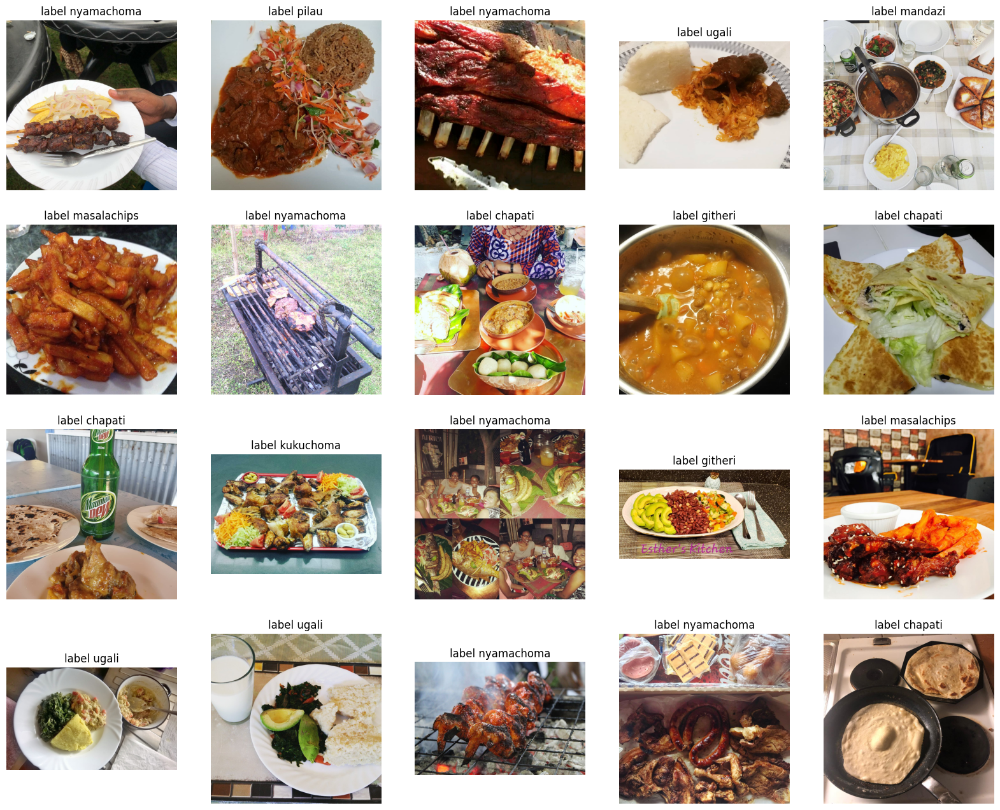

In [92]:
def visualization(df , index):
    id = str(df.iloc[index]['id'])
#     label = df.iloc[index]['class']
#     label = [id for id, name in classes.items() if name == label]
    image_path = os.path.join(data_root,"images","images",id+".jpg")
    image = Image.open(image_path)#.convert("RGB")
    return image


fig, axs = plt.subplots(4, 5, figsize=(20, 16))
for idx, ax in zip(np.arange(20), axs.flatten()):
    image = visualization(test_df, idx)
    ax.imshow(image)
    ax.set_title(f'label {labels[idx]}')
    ax.axis('off')


plt.show()

In [93]:
data = {
    "id" : test_df["id"],
    "class": (labels)
}

In [102]:
data2 = {
    "id" : test_df["id"],
    "class": (labels2)
}

In [94]:
submission = pd.DataFrame(data)

In [104]:
submission2 = pd.DataFrame(data2)

In [95]:
submission

,id,class
0,9156739011499789258,nyamachoma
1,2049465964503133373,pilau
2,6446998501027132988,nyamachoma
3,4194396063119815321,ugali
4,9018117998187006009,mandazi
...,...,...
1633,18302448610371772604,githeri
1634,15920672464676076400,chapati
1635,3232020170382870007,chapati
1636,3094804487341098468,kachumbari


In [114]:
submission2.to_csv('submission_file_en.csv', index=False)

In [113]:
%cd /content

/content


In [107]:
import os
for dirname, _, filenames in os.walk('/kaggle/working'):
   # print(filenames)
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/working/submission_file_en.csv


In [110]:
#%cd /kaggle/working
from IPython.display import FileLink
FileLink('submission_file_en.csv')

/kaggle/working/submission_file_en.csv

In [ ]:
%cd /kaggle/working
from IPython.display import FileLink
display(FileLink('lightning_logs/version_0/events.out.tfevents.1714833860.0e8de59271e5.34.0'))
display(FileLink('lightning_logs/version_0/hparams.yaml'))
display(FileLink('lightning_logs/version_0/checkpoints/FT_Food_classify_Data_checkpoints_062.ckpt'))



In [ ]:
logs_dir = 'lightning_logs/version_1'

file_list = os.listdir(logs_dir)
file_list
for file_name in file_list:
    file_path = os.path.join(logs_dir, file_name)
    display(FileLink(file_path))



## <font style="color:green">8. TensorBoard Dev Scalars Log Link [5 Points]</font>

**Share your TensorBoard scalars logs link here You can also share (not mandatory) your GitHub link, if you have pushed this project in GitHub.**


For example, [Find Project2 logs here](https://tensorboard.dev/experiment/kMJ4YU0wSNG0IkjrluQ5Dg/#scalars).

In [ ]:
#%load_ext tensorboard
%reload_ext tensorboard

# %tensorboard --logdir={logdir}
# # # To reload tensorBoard
# %reload_ext tensorboard

# logs folder path
%tensorboard --logdir=lightning_logs

## <font style="color:green">9. Kaggle Profile Link [50 Points]</font>

**Share your Kaggle profile link  with us here to score , points in  the competition.**

**For full points, you need a minimum accuracy of `75%` on the test data. If accuracy is less than `70%`, you gain  no points for this section.**


**Submit `submission.csv` (prediction for images in `test.csv`), in the `Submit Predictions` tab in Kaggle, to get evaluated for  this section.**

Username : smruthisreenivas
